# **Importing the required libraries**

In [1]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow 
import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")

%matplotlib inline
 
from sklearn.model_selection import train_test_split
 
from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
import random

# **Extracting Frames**

In [2]:
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 50
CHANNELS = 3  # Change to 1 if using grayscale
DATASET_DIR = "/kaggle/input/ucaucf-crime-annotation-dataset/UCF_Crimes/UCF_Crimes/Videos"
NORMAL_CLASS = "Training_Normal_Videos_Anomaly"
ANOMALY_CLASS_LABEL = 1
NORMAL_CLASS_LABEL = 0

CLASSES_LIST = ["Training_Normal_Videos_Anomaly", "Abuse", "Arrest", "Arson", "Assault", "Explosion", "Fighting", "RoadAccidents", "Robbery", "Shooting"]

# CLASSES_LIST = ["Training_Normal_Videos_Anomaly", "Abuse", "Arrest", "Arson", "Assault", 
#                 "Burglary", "Explosion", "Fighting", "RoadAccidents", "Robbery", "Shooting", 
#                 "Shoplifting", "Stealing", "Vandalism"]

# ["Training_Normal_Videos_Anomaly", "Assault", "Explosion", "Fighting", "RoadAccidents", "Robbery", "Shooting", 
#                 "Shoplifting", "Stealing", "Vandalism"]


In [3]:
def frames_extraction(video_path):
    video_reader = cv2.VideoCapture(video_path)
    
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = video_reader.get(cv2.CAP_PROP_FPS)
    
    max_frames = int(2 * 60 * fps) 
    video_frames_count = min(video_frames_count, max_frames)
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)
    
    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)   
        success, frame = video_reader.read()
        
        if not success:
            break
        
        resized_frame = cv2.resize(frame, (IMAGE_WIDTH, IMAGE_HEIGHT))
        normalized_frame = resized_frame / 255.0
        
        yield normalized_frame
    
    video_reader.release()

# **Creating the Data**

In [4]:
def create_dataset():
    # Use lists to accumulate features and labels as small batches are processed
    features = []
    labels = []
    video_files_paths = []
    
    for class_name in CLASSES_LIST:
        print(f'Processing Class: {class_name}')
        
        label = NORMAL_CLASS_LABEL if class_name == NORMAL_CLASS else ANOMALY_CLASS_LABEL
        class_dir = os.path.join(DATASET_DIR, class_name)
        files_list = os.listdir(class_dir)
        
        for file_name in files_list:
            video_file_path = os.path.join(class_dir, file_name)
            
            # Use frames_extraction as a generator
            frames = list(frames_extraction(video_file_path))
            
            # Check if frames meet SEQUENCE_LENGTH criteria
            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(label)
                video_files_paths.append(video_file_path)
    
    # Convert lists to numpy arrays when all data has been processed
    features = np.asarray(features)
    labels = np.array(labels)

    return features, labels, video_files_paths

In [5]:
# # Create the dataset.
features, labels, video_files_paths = create_dataset()

Processing Class: Training_Normal_Videos_Anomaly
Processing Class: Abuse
Processing Class: Arrest
Processing Class: Arson
Processing Class: Assault
Processing Class: Explosion
Processing Class: Fighting
Processing Class: RoadAccidents
Processing Class: Robbery
Processing Class: Shooting


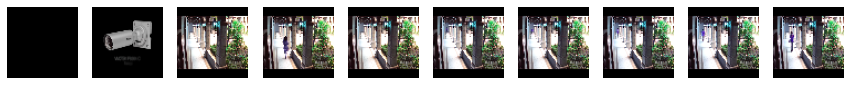

Sample Video Path: /kaggle/input/ucaucf-crime-annotation-dataset/UCF_Crimes/UCF_Crimes/Videos/Training_Normal_Videos_Anomaly/Normal_Videos827_x264.mp4
Label: Training_Normal_Videos_Anomaly


In [6]:
sample_index = random.randint(0, len(features) - 1)

sample_frames = features[sample_index]

fig, axes = plt.subplots(1, len(sample_frames), figsize=(15, 5))

for i, frame in enumerate(sample_frames):
    axes[i].imshow(frame)
    axes[i].axis('off')  # Hide the axis
#     axes[i].set_title(f"Frame {i+1}")

plt.show()

print(f"Sample Video Path: {video_files_paths[sample_index]}")
print(f"Label: {CLASSES_LIST[labels[sample_index]]}")


In [7]:
# # Saving the extracted data
# np.save("features.npy",features)
# np.save("labels.npy",labels)
# np.save("video_files_paths.npy",video_files_paths)

In [8]:
# features, labels, video_files_paths = np.load("features.npy") , np.load("labels.npy") ,  np.load("video_files_paths.npy")

# **Encoding and Splitting Training-Testing Sets**

In [9]:
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size = 0.25,shuffle = True, random_state = 42)

In [10]:
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(1162, 10, 64, 64, 3) (1162,)
(388, 10, 64, 64, 3) (388,)


In [19]:
labels_train[17]

1

In [20]:
from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2( include_top=False , weights="imagenet")

mobilenet.trainable=True

for layer in mobilenet.layers[:-20]:
    layer.trainable=False

# mobilenet.summary()

9420800/9406464 [==============================] - 0s 0us/step


# **Building The Model**

In [22]:
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten, LSTM, Bidirectional, TimeDistributed
from tensorflow.keras.models import Sequential

def create_model():
    model = Sequential()
    
    # Input layer matching the shape of the input data
    model.add(Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    # Pass MobileNet (or any pre-trained CNN model) inside TimeDistributed layer
    model.add(TimeDistributed(mobilenet))
    
    # Apply dropout to reduce overfitting
    model.add(Dropout(0.25))
    
    # Flatten the output of the CNN for each time step
    model.add(TimeDistributed(Flatten()))

    # Bidirectional LSTM layers
    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards=True)  
    model.add(Bidirectional(lstm_fw, backward_layer=lstm_bw))
    
    # Additional dense layers with ReLU activations and dropout for regularization
    model.add(Dropout(0.25))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.25))
    
    # Final layer for binary classification with sigmoid activation
    model.add(Dense(1, activation='sigmoid'))
    
    return model

In [23]:
MoBiLSTM_model = create_model()

In [24]:
MoBiLSTM_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 10, 2, 2, 1280)    2257984   
_________________________________________________________________
dropout (Dropout)            (None, 10, 2, 2, 1280)    0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, 10, 5120)          0         
_________________________________________________________________
bidirectional (Bidirectional (None, 64)                1319168   
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 256)               16640     
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0

In [92]:
# # Plot the structure of the contructed LRCN model.
# plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

# **Specifying Callbacks and Fitting**

In [48]:
# # Create Early Stopping Callback to monitor the accuracy
# early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.6,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)
# , callbacks = [early_stopping_callback,reduce_lr]

# Compiling the model 
MoBiLSTM_model.compile(loss='binary_crossentropy', optimizer = 'adam', metrics = ["accuracy"])
 
MobBiLSTM_model_history = MoBiLSTM_model.fit(
    x=features_train, 
    y=labels_train, 
    epochs=30, 
    batch_size=8, 
    shuffle=True, 
    validation_data=(features_test, labels_test),
    callbacks = [reduce_lr]
)


Epoch 1/30
146/146 [==============================] - 13s 46ms/step - loss: 0.1648 - accuracy: 0.9518 - val_loss: 0.9625 - val_accuracy: 0.7320
Epoch 2/30
146/146 [==============================] - 5s 31ms/step - loss: 0.1585 - accuracy: 0.9518 - val_loss: 0.9542 - val_accuracy: 0.7448
Epoch 3/30
146/146 [==============================] - 5s 31ms/step - loss: 0.1765 - accuracy: 0.9329 - val_loss: 1.0599 - val_accuracy: 0.6624
Epoch 4/30
146/146 [==============================] - 4s 30ms/step - loss: 0.1619 - accuracy: 0.9458 - val_loss: 0.9497 - val_accuracy: 0.7706
Epoch 5/30
146/146 [==============================] - 4s 30ms/step - loss: 0.1019 - accuracy: 0.9639 - val_loss: 1.2044 - val_accuracy: 0.7345
Epoch 6/30
146/146 [==============================] - 4s 31ms/step - loss: 0.1653 - accuracy: 0.9466 - val_loss: 0.9936 - val_accuracy: 0.7139
Epoch 7/30
146/146 [==============================] - 5s 31ms/step - loss: 0.1207 - accuracy: 0.9613 - val_loss: 0.9751 - val_accuracy: 0.732

In [28]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

13/13 [==============================] - 1s 33ms/step - loss: 0.8588 - accuracy: 0.7526


# **Model Evaluation**

In [29]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Get the Epochs Count
    epochs = range(len(metric_value_1))
 
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)
 
    plt.title(str(plot_name))
 
    plt.legend()

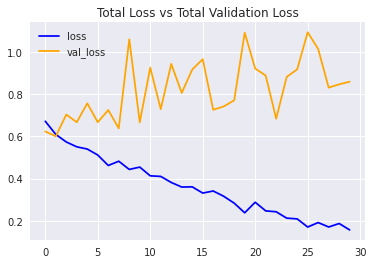

In [30]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

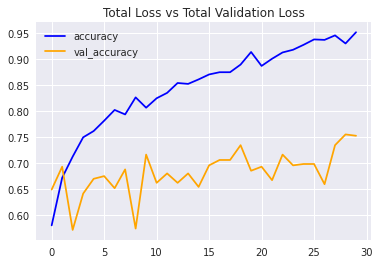

In [31]:
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Loss vs Total Validation Loss')

# **Predicting the Test Set**

In [32]:
labels_predict = MoBiLSTM_model.predict(features_test)

In [33]:
labels_predict.shape

(388, 1)

In [34]:
# Decoding the predictions using a threshold of 0.5
labels_predict = (labels_predict >= 0.5).astype(int)
labels_test_normal = labels_test  # Assuming labels_test is already binary (0 or 1)

In [35]:
labels_test_normal.shape , labels_predict.shape

((388,), (388, 1))

Accuracy Score

In [36]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.7525773195876289


Confusion Matrix

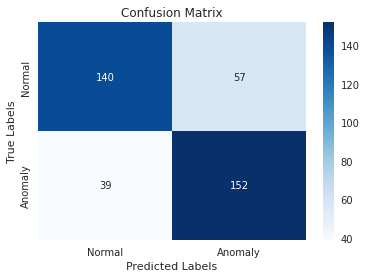

In [37]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `labels_test_normal` contains the true labels and `labels_predict` contains the predicted labels
conf_matrix = confusion_matrix(labels_test_normal, labels_predict)

# Plotting the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["Normal", "Anomaly"], yticklabels=["Normal", "Anomaly"])
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


Classification Report

In [38]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.78      0.71      0.74       197
           1       0.73      0.80      0.76       191

    accuracy                           0.75       388
   macro avg       0.75      0.75      0.75       388
weighted avg       0.76      0.75      0.75       388



In [39]:
# pip install tf2onnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.8/455.8 kB 7.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 38.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 58.1 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.19.4
    Uninstalling protobuf-3.19.4:
      Successfully uninstalled protobuf-3.19.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-io 0.21.0 requires tensorflow-io-gcs-filesystem==0.21.0, which is not installed.
beatrix-jupyterlab 3.1.7 requires google-cloud-bigquery-storage, which is not installed.
tfx-bsl 1.9.0 requires tensorflow!=2.0.*,!=2.1.*,!=2.2.*,!=2.3.*,!=2.4.*,!=2.5.*,!=2.6.*,!=2.7.*,!=2.8.*,<3,>=1.15.5, but you have tensorflow 2.6.4 which is incompatible.
tensorflow 2.6.4 requires h5py~=3.1.0, but you have h5py 3.7.0

In [42]:
model = MoBiLSTM_model

In [43]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 10, 2, 2, 1280)    2257984   
_________________________________________________________________
dropout (Dropout)            (None, 10, 2, 2, 1280)    0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, 10, 5120)          0         
_________________________________________________________________
bidirectional (Bidirectional (None, 64)                1319168   
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 256)               16640     
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0

In [46]:
from tensorflow.keras.utils import plot_model

# Optionally visualize model architecture
# plot_model(MoBiLSTM_model, to_file='MoBiLSTM_model.png', show_shapes=True)

# Calculate total memory (parameters * 4 bytes/float32)
total_params = model.count_params()
memory_utilization_MB = (total_params * 4) / (1024 ** 2)  # Convert to MB
print(f"Approximate memory utilization for model parameters: {memory_utilization_MB:.2f} MB")


Approximate memory utilization for model parameters: 13.87 MB


In [47]:
import tf2onnx
import tensorflow as tf

# Assume create_model() returns your trained model
# model = MoBiLSTM_model()
# Load weights if you have saved ones
# model.load_weights("path_to_weights.h5")


spec = (tf.TensorSpec((None, SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3), tf.float32),)
onnx_model, _ = tf2onnx.convert.from_keras(model, input_signature=spec, opset=13)

# Save to file
with open("anomaly_detection_model.onnx", "wb") as f:
    f.write(onnx_model.SerializeToString())


# **Prediction Frame By Frame**

In [51]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    
    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'), 
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
 
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
 
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():
 
        ok, frame = video_reader.read() 
        
        if not ok:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame 
        normalized_frame = resized_frame / 255
 
        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)
 
        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:                        
 
            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
 
            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)
 
            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
 
        # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)
         
        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)                       
        
    video_reader.release()
    video_writer.release()

In [52]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path): 

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))
        
    for counter, random_index in enumerate(random_range, 1):
        
        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.  
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
          
        ok, frame = video_reader.read() 

        if not ok:
            break 

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);ax.figure.set_size_inches(128,128);plt.tight_layout()
                            
    video_reader.release()

In [53]:
# Construct the output video path.
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

NameError: name 'ax' is not defined

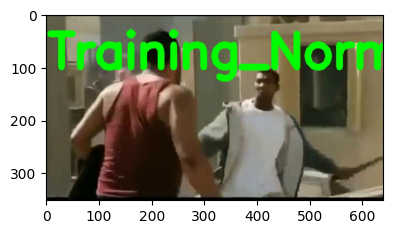

In [54]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_378.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [55]:
MoBiLSTM_model.save('MoBiLSTM_model.h5')

/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [56]:
MoBiLSTM_model.summary()


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_4 (TimeDist (None, 4, 4, 4, 1280)     2257984   
_________________________________________________________________
dropout_12 (Dropout)         (None, 4, 4, 4, 1280)     0         
_________________________________________________________________
time_distributed_5 (TimeDist (None, 4, 20480)          0         
_________________________________________________________________
bidirectional_2 (Bidirection (None, 64)                5251328   
_________________________________________________________________
dropout_13 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 256)               16640     
_________________________________________________________________
dropout_14 (Dropout)         (None, 256)              

In [57]:
from tensorflow.keras.utils import plot_model

# Optionally visualize model architecture
plot_model(MoBiLSTM_model, to_file='MoBiLSTM_model.png', show_shapes=True)

# Calculate total memory (parameters * 4 bytes/float32)
total_params = MoBiLSTM_model.count_params()
memory_utilization_MB = (total_params * 4) / (1024 ** 2)  # Convert to MB
print(f"Approximate memory utilization for model parameters: {memory_utilization_MB:.2f} MB")


Approximate memory utilization for model parameters: 28.87 MB


In [123]:
from IPython.display import HTML
from base64 import b64encode

# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

In [125]:
# # Play the actual video
# Play_Video(input_video_file_path)

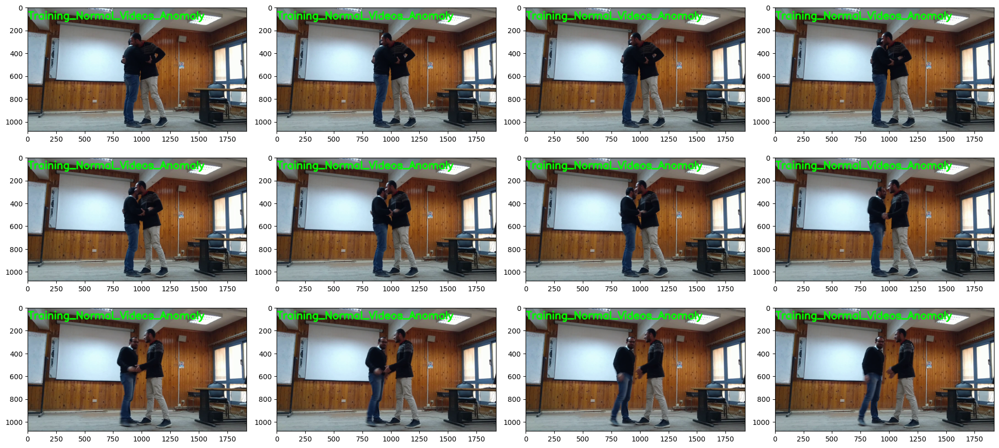

In [126]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_1.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [127]:
# Play the actual video
Play_Video(input_video_file_path)

# **Prediction For The Video**

In [128]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
 
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
 
    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)
 
    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    video_reader.release()

In [129]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_276.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

Predicted: Training_Normal_Videos_Anomaly
Confidence: 0.3230060040950775


In [130]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_23.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

Predicted: Training_Normal_Videos_Anomaly
Confidence: 0.7281558513641357


**Github Repository :** [Real Time Violence Detection](https://github.com/abduulrahmankhalid/Real-Time-Violence-Detection)

In [1]:
import os
import numpy as np
import cv2
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten, LSTM, Bidirectional, TimeDistributed
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split

# Constants
IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 10
DATASET_DIR = "/kaggle/input/ucaucf-crime-annotation-dataset/UCF_Crimes/UCF_Crimes/Videos"
NORMAL_CLASS = "Training_Normal_Videos_Anomaly"
ANOMALY_CLASS_LABEL = 1
NORMAL_CLASS_LABEL = 0

# List of classes
CLASSES_LIST = ["Training_Normal_Videos_Anomaly", "Abuse", "Arrest", "Arson", "Assault", 
                "Burglary", "Explosion", "Fighting", "RoadAccidents", "Robbery", "Shooting", 
                "Shoplifting", "Stealing", "Vandalism"]

# Frame extraction generator function
def frames_extraction(video_path):
    video_reader = cv2.VideoCapture(video_path)
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = video_reader.get(cv2.CAP_PROP_FPS)
    max_frames = int(3 * 60 * fps)
    video_frames_count = min(video_frames_count, max_frames)
    skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

    for frame_counter in range(SEQUENCE_LENGTH):
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
        success, frame = video_reader.read()
        if not success:
            break
        resized_frame = cv2.resize(frame, (IMAGE_WIDTH, IMAGE_HEIGHT))
        normalized_frame = resized_frame.astype(np.float32) / 255.0
        yield normalized_frame

    video_reader.release()

# Data generator class
class VideoDataGenerator(Sequence):
    def __init__(self, video_files, labels, batch_size, shuffle=True):
        self.video_files = video_files
        self.labels = labels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.video_files) / self.batch_size))

    def __getitem__(self, index):
        batch_video_files = self.video_files[index * self.batch_size:(index + 1) * self.batch_size]
        batch_labels = self.labels[index * self.batch_size:(index + 1) * self.batch_size]
        
        X, y = self.__data_generation(batch_video_files, batch_labels)
        return X, y

    def on_epoch_end(self):
        if self.shuffle:
            indices = np.arange(len(self.video_files))
            np.random.shuffle(indices)
            self.video_files = [self.video_files[i] for i in indices]
            self.labels = [self.labels[i] for i in indices]

    def __data_generation(self, batch_video_files, batch_labels):
        X = []
        y = []
        for i, video_file in enumerate(batch_video_files):
            frames = list(frames_extraction(video_file))
            if len(frames) == SEQUENCE_LENGTH:
                X.append(frames)
                y.append(batch_labels[i])
        X = np.array(X, dtype=np.float32)
        y = np.array(y, dtype=np.float32)
        return X, y

# Collecting video file paths and labels
video_files = []
labels = []
for class_name in CLASSES_LIST:
    class_label = NORMAL_CLASS_LABEL if class_name == NORMAL_CLASS else ANOMALY_CLASS_LABEL
    class_dir = os.path.join(DATASET_DIR, class_name)
    for file_name in os.listdir(class_dir):
        video_file_path = os.path.join(class_dir, file_name)
        video_files.append(video_file_path)
        labels.append(class_label)

# Splitting data into training and testing sets
video_files_train, video_files_test, labels_train, labels_test = train_test_split(video_files, labels, test_size=0.25, shuffle=True, random_state=42)

# Parameters for the data generator
batch_size = 4

# Creating training and testing generators
train_generator = VideoDataGenerator(video_files_train, labels_train, batch_size=batch_size, shuffle=True)
test_generator = VideoDataGenerator(video_files_test, labels_test, batch_size=batch_size, shuffle=False)


from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2( include_top=False , weights="imagenet")

#Fine-Tuning to make the last 40 layer trainable
mobilenet.trainable=True

for layer in mobilenet.layers[:-20]:
    layer.trainable=False

# mobilenet.summary()

IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64
SEQUENCE_LENGTH = 10

# Model definition
def create_model():
    model = Sequential()
    model.add(Input(shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(mobilenet))
    model.add(Dropout(0.25))
    model.add(TimeDistributed(Flatten()))
    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards=True)  
    model.add(Bidirectional(lstm_fw, backward_layer=lstm_bw))
    model.add(Dropout(0.25))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(1, activation='sigmoid'))
    return model
# Create and compile model
model = create_model()

9420800/9406464 [==============================] - 0s 0us/step


In [2]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train model with generators
MobBiLSTM_model_history=model.fit(train_generator, epochs=5, validation_data=test_generator)


Epoch 1/5
328/328 [==============================] - 662s 2s/step - loss: 0.6694 - accuracy: 0.5678 - val_loss: 0.6841 - val_accuracy: 0.5757
Epoch 2/5
328/328 [==============================] - 534s 2s/step - loss: 0.6333 - accuracy: 0.6494 - val_loss: 0.6212 - val_accuracy: 0.6812
Epoch 3/5
162/328 [=============>................] - ETA: 3:23 - loss: 0.6208 - accuracy: 0.6836

KeyboardInterrupt: 